<a href="https://colab.research.google.com/github/VeereshElango/CaliforniaHousePricePrediction/blob/master/California_House_Price_Prediction_V2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

![CaliforniaHousing](https://source.unsplash.com/-Ey_0PMz900/1600x500)


# Goal



Given the provided dataset, use statistical methods and machine learning algorithms to explore the dataset and build a model that predicts house prices in California.

# Load data

In [0]:
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

In [0]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from matplotlib import style
import seaborn as sns
%matplotlib inline

In [0]:

%matplotlib inline  
style.use('fivethirtyeight') 
sns.set(style='whitegrid',color_codes=True)

In [0]:
df_raw = pd.read_csv("https://raw.githubusercontent.com/VeereshElango/CalifornianHousingDatasetAnalysis/master/californiahousing.csv", index_col=0)

In [5]:
# Keep the raw values unaltered for future comparison
df = df_raw.copy()
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,total_pools,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,11,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,150,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,17,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,23,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,32,565.0,259.0,3.8462,342200.0,NEAR BAY


After importing the dataset, we need to understand with what kind of data that we are dealing with.

# Dating with Data


<img width="1600" height="500" src="https://source.unsplash.com/KgLtFCgfC28">

If dating is all about understanding each other, then this section is for that. 

## What variables do we have?

In [6]:
df.dtypes

longitude             float64
latitude              float64
housing_median_age    float64
total_rooms           float64
total_bedrooms        float64
total_pools             int64
population            float64
households            float64
median_income         float64
median_house_value    float64
ocean_proximity        object
dtype: object

Most of the columns are float datatypes.They are named "total_---" columns, it 
is logical to have them as integers. If there any decimal values in those columns then we should check them.

In [7]:
print("Does these columns has only integer values?")
for col in df.drop(["ocean_proximity","total_pools","longitude","latitude"],axis=1).columns:
    print("{} - {}".format(col, df[col].dropna().apply(float.is_integer).all()))

Does these columns has only integer values?
housing_median_age - True
total_rooms - True
total_bedrooms - True
population - True
households - True
median_income - False
median_house_value - True


Except median_income rest are only integers. Logical.

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20640 entries, 0 to 20639
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   total_pools         20640 non-null  int64  
 6   population          20640 non-null  float64
 7   households          20640 non-null  float64
 8   median_income       20640 non-null  float64
 9   median_house_value  20640 non-null  float64
 10  ocean_proximity     20640 non-null  object 
dtypes: float64(9), int64(1), object(1)
memory usage: 1.9+ MB


We don't have the units for the data. Let's add that from [Google's dataset description ](https://developers.google.com/machine-learning/crash-course/california-housing-data-description)

**longitude**	A measure of how far west a house is; a higher value is farther west	
**latitude**	A measure of how far north a house is; a higher value is farther north	
**housingMedianAge**	Median age of a house within a block; a lower number is a newer building	
**totalRooms**	Total number of rooms within a block	
**totalBedrooms**	Total number of bedrooms within a block	
**population**	Total number of people residing within a block	
**households**	Total number of households, a group of people residing within a home unit, for a block	
**medianIncome**	Median income for households within a block of houses (measured in tens of thousands of US Dollars)	
**medianHouseValue**	Median house value for households within a block (measured in US Dollars)	

We have 
*   20640 entries
*   Geo-spatial information 
*   7 numerical features
*   1 categorical feature
*   1 numerical target variable

## Are they enough?

Is this enough to predict the our target variable **median_house_value** ?

Logically, *median household area* (in sq.km) might be a interesting feature in this case.

Also, we could have discussed with SME (Subject Matter Expert).

In our case, we will consider they are enough and proceed

## Data Quality

<img width="1200" height="300" src="https://source.unsplash.com/2FPjlAyMQTA">

### Is there any missing values?

In [9]:
df.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
total_pools             0
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

Yes, we have one column **total bedrooms** with  207 missing values.

### Can a household has more or equal number of bedrooms and rooms?
Before fixing the missing values, let's do a quick logical check that **total_bedrooms** should not be greater than **total_rooms**

In [10]:
df[df.total_bedrooms>=df.total_rooms]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,total_pools,population,households,median_income,median_house_value,ocean_proximity
3126,-117.79,35.21,4.0,2.0,2.0,0,6.0,2.0,2.375,137500.0,INLAND
5916,-118.44,34.28,46.0,11.0,11.0,1,24.0,13.0,2.875,162500.0,<1H OCEAN
19435,-121.04,37.67,16.0,19.0,19.0,0,166.0,9.0,0.536,162500.0,INLAND


When total_bedrooms and total_rooms are equal, it raises the question whether **total_rooms** are excluding the bedrooms or not.

Since there are only three rows, let's ignore this as of now and look into how to fill the values.


### Filling missing values

In [11]:
df.total_bedrooms.describe()

count    20433.000000
mean       537.870553
std        421.385070
min          1.000000
25%        296.000000
50%        435.000000
75%        647.000000
max       6445.000000
Name: total_bedrooms, dtype: float64

The total_bedrooms cannot be replaced with mean or median because the there is a logical condition that total_bedrooms has to be less than (or equal to) total_rooms.

In [12]:
df.corr()["total_bedrooms"].sort_values(ascending=False)

total_bedrooms        1.000000
households            0.979728
total_rooms           0.930380
total_pools           0.884979
population            0.877747
longitude             0.069608
median_house_value    0.049686
median_income        -0.007723
latitude             -0.066983
housing_median_age   -0.320451
Name: total_bedrooms, dtype: float64

There is a strong correlation between total_bedrooms and (house_holds, total_rooms, total_pools, population). Let's use IterativeImputer

In [0]:
X_fill = df[["households","total_rooms","total_pools","population","total_bedrooms"]]

In [0]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
imp = IterativeImputer(max_iter=10, random_state=42)
Y = imp.fit_transform(X_fill)

In [0]:
df[["households","total_rooms","total_pools","population","total_bedrooms"]] = Y

In [16]:
df.isnull().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
total_pools           0
population            0
households            0
median_income         0
median_house_value    0
ocean_proximity       0
dtype: int64

In [17]:
df[df.total_bedrooms>=df.total_rooms]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,total_pools,population,households,median_income,median_house_value,ocean_proximity
3126,-117.79,35.21,4.0,2.0,2.0,0.0,6.0,2.0,2.375,137500.0,INLAND
5916,-118.44,34.28,46.0,11.0,11.0,1.0,24.0,13.0,2.875,162500.0,<1H OCEAN
19435,-121.04,37.67,16.0,19.0,19.0,0.0,166.0,9.0,0.536,162500.0,INLAND


Sanity check

In [18]:
df[df_raw.isnull().any(axis=1)].sample(10)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,total_pools,population,households,median_income,median_house_value,ocean_proximity
6253,-117.96,34.03,35.0,2093.0,412.482386,30.0,1755.0,403.0,3.4115,150400.0,<1H OCEAN
4738,-118.38,34.05,49.0,702.0,193.058153,23.0,458.0,187.0,4.8958,333600.0,<1H OCEAN
13656,-117.30,34.05,6.0,2155.0,427.325815,21.0,1039.0,391.0,1.6675,95800.0,INLAND
20460,-118.75,34.29,17.0,5512.0,910.920317,92.0,2734.0,814.0,6.6073,258100.0,<1H OCEAN
6590,-118.18,34.19,48.0,1371.0,186.583660,8.0,528.0,155.0,15.0001,500001.0,<1H OCEAN
18261,-122.08,37.37,29.0,1229.0,212.469434,24.0,707.0,194.0,7.1108,465000.0,NEAR BAY
9845,-121.90,36.58,31.0,1431.0,411.707413,40.0,704.0,393.0,3.1977,289300.0,NEAR OCEAN
19402,-120.93,37.73,14.0,2799.0,608.175365,82.0,2294.0,596.0,2.6343,81500.0,INLAND
14152,-117.09,32.77,31.0,3062.0,598.398139,75.0,1263.0,539.0,3.0875,291500.0,NEAR OCEAN
290,-122.16,37.77,47.0,1256.0,241.079319,12.0,570.0,218.0,4.3750,161900.0,NEAR BAY


We have imputed the missing value in a logical way

### Can a household have less rooms than number of house units?


In [19]:
df[df.total_rooms<df.households]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,total_pools,population,households,median_income,median_house_value,ocean_proximity
5916,-118.44,34.28,46.0,11.0,11.0,1.0,24.0,13.0,2.8750,162500.0,<1H OCEAN
8219,-118.21,33.79,33.0,32.0,18.0,4.0,96.0,36.0,4.5938,112500.0,NEAR OCEAN


This is not logical. We should discuss about this with SME or individuals related to data collection.

Since they are close enough, I would like to replace the values equal to households.


In [0]:
df.loc[(df.total_rooms<df.households),"total_rooms"] = df[df.total_rooms<df.households]["households"]

In [21]:
#Sanity check
len(df[df.total_rooms<df.households])

0

### Sanity check on total_pools

In [22]:
df[(df.total_pools>= df.total_rooms)|(df.total_pools>=df.population)|(df.total_pools>=df.households)|(df.total_pools>=df.total_bedrooms)]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,total_pools,population,households,median_income,median_house_value,ocean_proximity


### What's your shape?

In [23]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,total_pools,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763372,537.925324,49.457946,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.614904,421.192143,42.641988,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,0.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,295.141159,24.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,39.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,61.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,890.000000,35682.000000,6082.000000,15.000100,500001.000000


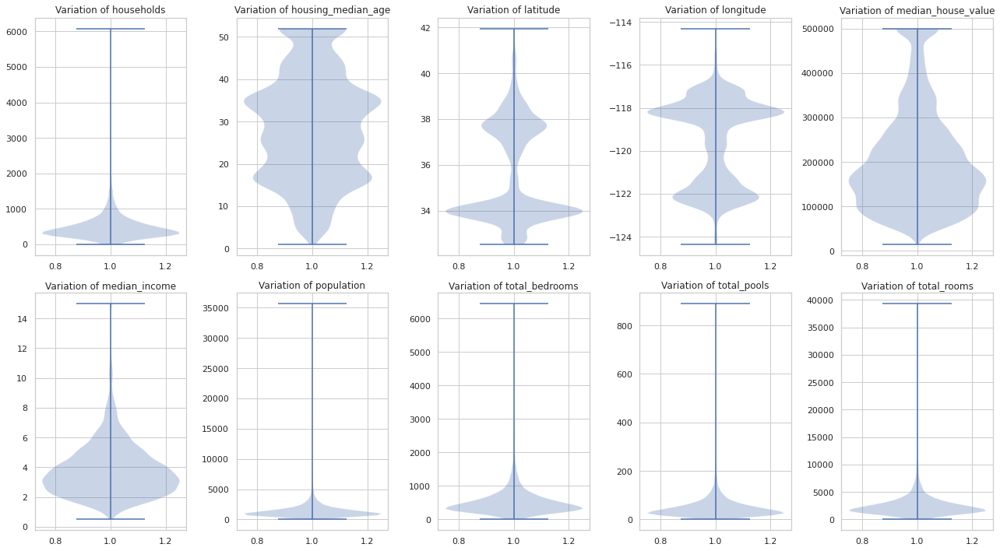

In [24]:
df_without_null = df.dropna(axis=0)
fig,axes=plt.subplots(2,5)
columns= df_without_null.drop("ocean_proximity",axis=1).columns.sort_values().tolist()

c = 0
for i in range (2):
    for j in range (5):
        axes[i,j].violinplot(df_without_null[columns[c]])
        axes[i,j].set_title('Variation of '+columns[c])
        c+=1
fig=plt.gcf()
fig.set_size_inches(18,10)
fig.tight_layout()

Coming to our target variable **median_house_value**, looks logical. The distribution of house prices are denser in mid-range values than high-range values.

**households**, **population**, **total_bedrooms**, **total_pools**, **total_rooms** has some extreme values which are out of their nature.

The extreme values are 

total_rooms 39320.000000	
total_bedrooms 6445.000000	
total_pools 890.000000	
population 35682.000000	
households 6082.000000	

It is hard to guess whether these values are logical since they are total. Let's find their average per household.

Since, we are going to make some operations on top of data, let's create a copy and fill the missing values.

In [0]:
for col in ["total_bedrooms","total_pools","total_rooms","population"]:
    df["avg_"+col] = df[col]/df["households"]

In [26]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,total_pools,population,households,median_income,median_house_value,avg_total_bedrooms,avg_total_pools,avg_total_rooms,avg_population
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763372,537.925324,49.457946,1425.476744,499.539680,3.870671,206855.816909,1.096795,0.098002,5.429013,3.070655
std,2.003532,2.135952,12.585558,2181.614904,421.192143,42.641988,1132.462122,382.329753,1.899822,115395.615874,0.473755,0.029487,2.474150,10.386050
min,-124.350000,32.540000,1.000000,2.000000,1.000000,0.000000,3.000000,1.000000,0.499900,14999.000000,0.333333,0.000000,1.000000,0.692308
25%,-121.800000,33.930000,18.000000,1447.750000,295.141159,24.000000,787.000000,280.000000,2.563400,119600.000000,1.006304,0.072870,4.440716,2.429741
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,39.000000,1166.000000,409.000000,3.534800,179700.000000,1.049237,0.098207,5.229129,2.818116
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,61.000000,1725.000000,605.000000,4.743250,264725.000000,1.099740,0.123191,6.052381,3.282261
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,890.000000,35682.000000,6082.000000,15.000100,500001.000000,34.066667,0.149965,141.909091,1243.333333


In real time, is it possible for 1243 people to live in a single house unit. May be! Let's create another variable number of rooms per person in a house unit.

### How many rooms does one individual need in a house unit?

In [27]:
df["rooms_per_individual_in_a_household"] = df.avg_total_rooms/ df.avg_population
df.rooms_per_individual_in_a_household.describe()

count    20640.000000
mean         1.976976
std          1.146012
min          0.002547
25%          1.522382
50%          1.937936
75%          2.296090
max         55.222222
Name: rooms_per_individual_in_a_household, dtype: float64

Is it possible for more than 5 persons to live in a single room? Logically no. At this point, we could have discussed about data collection process.

In [28]:
print("Quantile 0.005 : {}".format(df.rooms_per_individual_in_a_household.quantile(0.005)))
print("Quantile 0.995 : {}".format(df.rooms_per_individual_in_a_household.quantile(0.995)))

Quantile 0.005 : 0.5641596616349015
Quantile 0.995 : 6.3405067895363345


Let's be generous and assume a condition that no room can accommodate more than 8 individuals and an individual cannot have more than 15 rooms in a house


In [29]:
df = df[(df.rooms_per_individual_in_a_household>(1/8))&(df.rooms_per_individual_in_a_household<(7))].reset_index(drop=True)
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,total_pools,population,households,median_income,median_house_value,avg_total_bedrooms,avg_total_pools,avg_total_rooms,avg_population,rooms_per_individual_in_a_household
count,20548.000000,20548.000000,20548.000000,20548.000000,20548.000000,20548.000000,20548.000000,20548.000000,20548.000000,20548.000000,20548.000000,20548.000000,20548.000000,20548.000000,20548.000000
mean,-119.570214,35.623307,28.683181,2633.489196,537.578630,49.627750,1428.741191,501.201479,3.871299,206997.175394,1.075567,0.098064,5.326175,2.939066,1.929788
std,2.004848,2.132142,12.578571,2179.253887,420.820986,42.655804,1129.382918,382.295733,1.898934,115481.264261,0.181234,0.029442,1.386845,0.937046,0.646678
min,-124.350000,32.540000,1.000000,2.000000,1.000000,0.000000,3.000000,1.000000,0.499900,14999.000000,0.333333,0.000000,1.000000,0.750000,0.129450
25%,-121.800000,33.930000,18.000000,1448.000000,296.000000,25.000000,791.000000,281.000000,2.563975,119600.000000,1.006118,0.072935,4.437306,2.432241,1.521017
50%,-118.490000,34.250000,29.000000,2126.000000,435.000000,39.000000,1169.000000,410.000000,3.535500,179900.000000,1.048825,0.098243,5.223901,2.821548,1.935804
75%,-118.010000,37.710000,37.000000,3144.000000,646.242226,61.000000,1727.000000,606.000000,4.744375,265000.000000,1.098799,0.123249,6.039059,3.283439,2.291187
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,890.000000,35682.000000,6082.000000,15.000100,500001.000000,6.500000,0.149965,24.500000,41.214286,6.956175


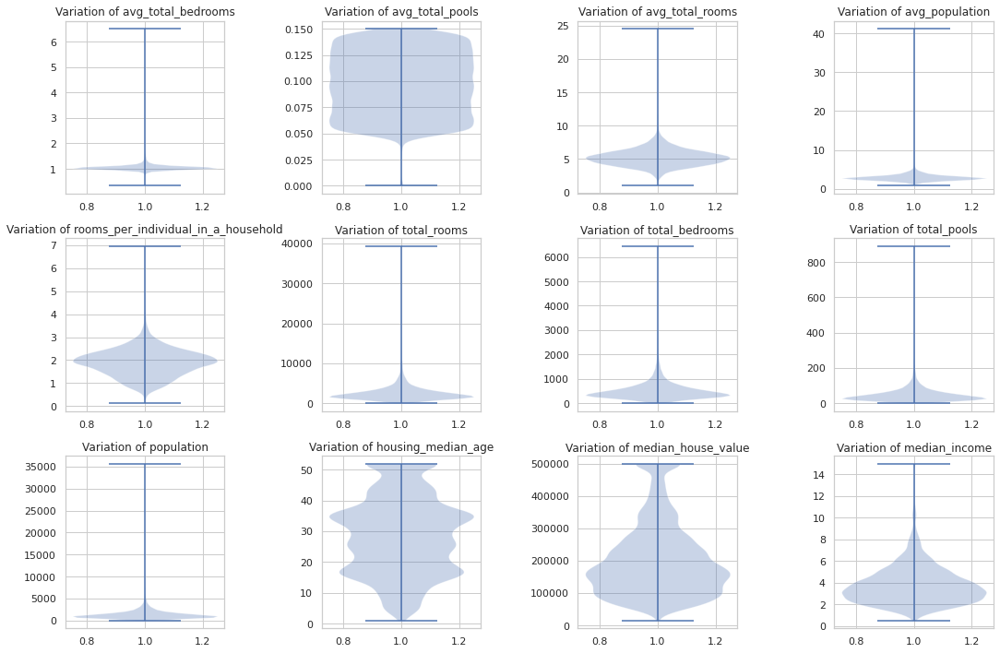

In [30]:

fig,axes=plt.subplots(3,4)
columns= ["avg_total_bedrooms",	"avg_total_pools",	"avg_total_rooms",	
          "avg_population",	"rooms_per_individual_in_a_household",
          "total_rooms", "total_bedrooms",	"total_pools", "population",
          "housing_median_age", "median_house_value","median_income"]
c = 0
for i in range (3):
    for j in range (4):
        axes[i,j].violinplot(df[columns[c]])
        axes[i,j].set_title('Variation of '+columns[c])
        c+=1
fig=plt.gcf()
fig.set_size_inches(15,10)
fig.tight_layout()

### Relationship between features and target variable

#### Numerical features

We will start with numerical features and target variable.

In [0]:
median_house_value = df.median_house_value
df.drop("median_house_value",axis=1,inplace=True)
df["median_house_value"] = median_house_value

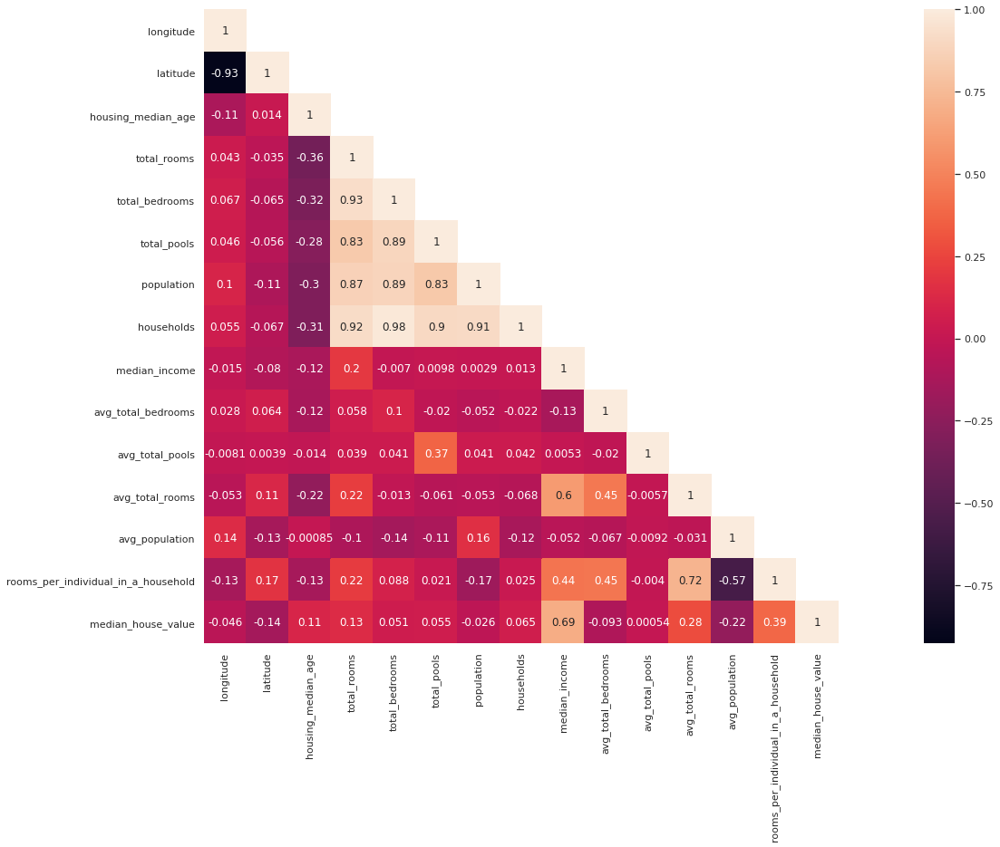

In [32]:
cor_mat= df.corr()
mask = np.array(cor_mat)
mask[np.tril_indices_from(mask)] = False
fig=plt.gcf()
fig.set_size_inches(30,12)
sns.heatmap(data=cor_mat,mask=mask,square=True,annot=True,cbar=True)

**median_house_value** & **median_income** has pearson correlation on 0.69. So, we have one good correlating feature. 

The features which we created during data exploration has benifitted us with good coorelation with target variable.
**rooms_per_individual_in_a_household** : 0.39 

**avg_total_rooms** : 0.28

**avg_population** : -0.22


Among rest of the features, **households** has >=0.90 correlation with **total_rooms**, **total_bedrooms**, **total_pools** & **population**. That's logical but it is redundant to have highly correlated features.


#### Categorical features

One last, let's check whether distribution of **median_house_value** has clear seperation with categorical variable **ocean_proximity**. 

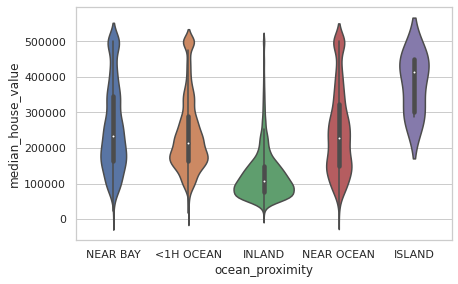

In [33]:
sns.violinplot(x="ocean_proximity", y="median_house_value", data=df)

Except _ISLAND_ category all other categories has values distributed all over the range. Well, _INLAND_ has most values in under 200,000 with some exceptions.

So, no clear segregation based on categorical variable.

In [34]:
import folium
from folium import Circle

# Create a base map
map_to_plot = folium.Map(location=[38.481380, -115.758344], tiles='cartodbpositron', zoom_start=6)

def color_producer(val):
    if val == "NEAR BAY":
        return 'green'
    elif val == "<1H OCEAN":
        return "blue"
    elif val == "INLAND":
        return "red"
    elif val == "NEAR OCEAN":
        return "yellow"
    else:
        return 'black'

# Add a bubble map to the base map
for i in range(0,len(df)):
    Circle(
        location=[df.iloc[i]['latitude'], df.iloc[i]['longitude']],
        radius= 50,
        color=color_producer(df.iloc[i]['ocean_proximity']),
        opacity = 0.5
        ).add_to(map_to_plot)

# Display the map
#map_to_plot

legend_html =   '''
                <div style="position: fixed; 
                            bottom: 50px; left: 50px; width: 200px; height: 200px; 
                            border:2px solid grey; z-index:9999; font-size:14px;
                            ">&nbsp; Ocean Proximity <br>
                              &nbsp; NEAR BAY &nbsp; <i class="fa fa-map-marker fa-2x" style="color:green"></i><br>
                              &nbsp; <1H OCEAN &nbsp; <i class="fa fa-map-marker fa-2x" style="color:blue"></i><br>
                              &nbsp; INLAND&nbsp; <i class="fa fa-map-marker fa-2x" style="color:red"></i><br>
                              &nbsp; NEAR OCEAN &nbsp; <i class="fa fa-map-marker fa-2x" style="color:yellow"></i><br>
                              &nbsp; ISLAND &nbsp; <i class="fa fa-map-marker fa-2x" style="color:black"></i><br>
                </div>
                ''' 
map_to_plot.get_root().html.add_child(folium.Element(legend_html))

map_to_plot

This plot helps us verify the **ocean_proximity** labels. It feels like they are of good quality. When we zoom in to the clusters/dense regions, we could notice they were in and around cities/towns.

# Strategy

At this point, we understood what needs to fixed in data and may be some ideas for feature engineering. 


## Should we start with data pre-processing and feature engineering?

There are _n_ number of ways you could treat the data which may or may not affect our result. 
Yes, we have to do data pre-processing and feature engineering but more in an Agile way.

## What do we mean by Agile way?

<img align="left" width="200" height="150" src="https://miro.medium.com/max/470/0*65DbU_Hc5fBMIrbO.png">


We will start with simple data pre-processing & feature engineering methods, to create a model in an end-to-end fashion. Then, we will improve it iteratively. 

By doing this way, we have some reuslts to compare our _eureka_ moments with data preparaion, feature engineering or new model design. 

In real-time, we should discuss with cutomers about our strategy and discuss with at the end of every iteration.

## Evaluation

We need fix our evaluation method for all our iterations because we don't want to compare _Apples_ & _Oranges_.

### Metric
We are dealing with regression problem. For this usecase, we will go with [RMSE(Root Mean Square Error)  ](https://en.wikipedia.org/wiki/Root-mean-square_deviation). In RMSE, 0 indicates perfect value. 


$$RMSE = \sqrt{(\frac{1}{n})\sum_{i=1}^{n}(y_{i} - x_{i})^{2}}$$

RMSW give more weight to points further away from the mean, so it is good for training the models. It cannot be directly interpreted by the customer as + or - of the predicted value.

In [0]:
from sklearn.metrics import mean_squared_error, mean_absolute_error


class TestEvaluation:
    def __init__(self,model):
        self.model = model
        self.predictions = None
    def test_score (self, X_test, y_test):
        self.predictions = self.model.predict(X_test)
        # it could be confusing to notice squared = false. 
        # Check the documentation https://scikit-learn.org/stable/modules/generated/sklearn.metrics.mean_squared_error.html
        rmse = mean_squared_error(y_test, self.predictions, squared=False)
        mae = mean_absolute_error(y_test, self.predictions)
        return rmse, mae


In real-time, we should verify our evalution policy with SME's before beginning our model development.

### Common train & test

In [0]:
from sklearn.model_selection import StratifiedShuffleSplit

We need to predict the house price in California and we noticed that we have samples from all over the region. So we have to make sure that we samples from all regions in both train and test.

In [37]:
split=StratifiedShuffleSplit(n_splits=1,test_size=0.2,random_state=42)
for train_index,test_index in split.split(df,df['ocean_proximity']):
    train_index = train_index
    test_index = test_index

print("Number of samples in train are {} & test are {}".format(len(train_index), len(test_index)))
tr_tst_split = pd.concat([
           df.loc[train_index].ocean_proximity.value_counts(),
           df.loc[test_index].ocean_proximity.value_counts()
],
axis=1)
tr_tst_split.columns = ["train","test"]
tr_tst_split

Number of samples in train are 16438 & test are 4110


,train,test
<1H OCEAN,7308,1827
INLAND,5170,1293
NEAR OCEAN,2124,531
NEAR BAY,1832,458
ISLAND,4,1


### Evaluation Utility

In [0]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.pipeline import Pipeline, FeatureUnion

In [0]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor

In [0]:
class EstimatorSelectionHelper:
    COLUMNS = ['estimator', 'min_score', 'mean_score', 'max_score', 'std_score']

    def __init__(self, models, params, pipeline=None):
        if not set(models.keys()).issubset(set(params.keys())):
            missing_params = list(set(models.keys()) - set(params.keys()))
            raise ValueError("Some estimators are missing parameters: %s" % missing_params)
        self.models = models
        self.params = params
        self.keys = models.keys()
        self.grid_searches = {}
        self.pipeline=pipeline
        self.result_df = None
        

    def fit(self, X, y, cv=3, n_jobs=3, verbose=1, scoring=None, refit=False):
        self.update_params()
        for key in self.keys:
            print("Running GridSearchCV for %s." % key)
            model = self.models[key]
            params = self.params[key]
            pipeline_steps = []            
            if self.pipeline is not None:
                pipeline_steps = pipeline_steps + self.pipeline
            pipeline_steps.append((key, model))
            pipeline = Pipeline(pipeline_steps)
            gs = GridSearchCV(pipeline, params, cv=cv, n_jobs=n_jobs,
                              verbose=verbose, scoring=scoring, refit=refit,
                              return_train_score=True)
            gs.fit(X,y)
            self.scoring = scoring
            self.grid_searches[key] = gs    
    
    def update_params(self):
        key_params = {}
        for key, param in self.params.items():
            params = {}
            for p_key, p_value in param.items():
                params[key+"__"+p_key] = p_value
            key_params[key] = params
        self.params = key_params

    def score_summary(self, sort_by='mean_score'):
        def row(key, scores, params):
            d = {
                 'estimator': key,
                 'min_score': min(scores),
                 'max_score': max(scores),
                 'mean_score': np.mean(scores),
                 'std_score': np.std(scores),
            }
            return pd.Series({**params,**d})

        rows = []
        for k in self.grid_searches:
            params = self.grid_searches[k].cv_results_['params']
            scores = []
            for i in range(self.grid_searches[k].cv):
                key = "split{}_test_score".format(i)
                r = self.grid_searches[k].cv_results_[key]        
                scores.append(r.reshape(len(params),1))

            all_scores = np.hstack(scores)
            if self.scoring =="neg_mean_squared_error":
                all_scores =np.sqrt(-all_scores)
            for p, s in zip(params,all_scores):
                rows.append((row(k, s, p)))

        df = pd.concat(rows, axis=1).T.sort_values([sort_by], ascending=False)
        
        columns = EstimatorSelectionHelper.COLUMNS 
        columns = columns + [c for c in df.columns if c not in columns]
        self.result_df = df[columns]
        return self.result_df

    def best_estimator(self,estimator):
        return self.grid_searches[estimator].best_estimator_

    def plot_results(self, by):
        df = self.result_df.reset_index(drop=True).reset_index()
        param_columns = [ col for col in df.columns if col not in EstimatorSelectionHelper.COLUMNS]
        fig= px.scatter(df, x="index", y=by, color="estimator", hover_data=param_columns )
        fig.show()



# Iteration I - Base model - 115K

In order to compare with any other, models let's do basic model.
For any given sample, we will return the mean or median learned from the training data.

## Data preparation

In [0]:
x_train = df.loc[train_index][["median_house_value"]]
y_train = df.loc[train_index][["median_house_value"]]
x_test = df.loc[test_index][["median_house_value"]]
y_test = df.loc[test_index][["median_house_value"]]

## Model development

In [0]:
from sklearn.base import BaseEstimator, TransformerMixin

class BaseModel( BaseEstimator, TransformerMixin ):
    def __init__(self, method="mean"):
        self.method = method
        self.trained_value = None

    def fit(self, X, y = None ):
        if self.method == "mean":
            self.trained_value = X.mean()
        elif self.method == "median":
            self.trained_value = X.median()
        return self
        
    def transform(self, X, y = None ):
        return np.full(X.shape, self.trained_value)

    def predict(self, X, y=None):
        return np.full(X.shape, self.trained_value)



In [0]:
models = {
    'BaseModel_Mean': BaseModel(),
    'BaseModel_Median': BaseModel(method="median")
}

params = {
    'BaseModel_Mean': {},
    'BaseModel_Median':{}
}

In [45]:
helper = EstimatorSelectionHelper(models, params)
helper.fit(x_train,y_train, scoring="neg_mean_squared_error", n_jobs=-1, cv=5, refit=True)
results =helper.score_summary(sort_by='mean_score')
helper.plot_results("mean_score")
results

Running GridSearchCV for BaseModel_Mean.
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    2.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.1s finished


Running GridSearchCV for BaseModel_Median.
Fitting 5 folds for each of 1 candidates, totalling 5 fits


,estimator,min_score,mean_score,max_score,std_score
1,BaseModel_Median,116541,118621,121713,2487.51
0,BaseModel_Mean,113811,115603,118087,1908.32


## Results

In [46]:
optimised_model = helper.best_estimator("BaseModel_Mean")
print(optimised_model)
rmse, mae = TestEvaluation(optimised_model).test_score(x_test, y_test)
print("Test dataset - RMSE score : ",rmse)
print("Test dataset - MAE score : ", mae)

Pipeline(memory=None, steps=[('BaseModel_Mean', BaseModel(method='mean'))],
         verbose=False)
Test dataset - RMSE score :  114980.4901418754
Test dataset - MAE score :  90370.17401424923


We have basic results, without any complex models. This enables us to compare the results.

# Iteration II - Linear Regression - RMSE: 82k

**median_income** has highest correlation with target variable **median_house_value**. 

So, we will create our simple model with just one feature and then we will include other features step by step. 

## Data preparation

In [0]:
x_train = df.loc[train_index][["median_income"]]
y_train = df.loc[train_index][["median_house_value"]]
x_test = df.loc[test_index][["median_income"]]
y_test = df.loc[test_index][["median_house_value"]]

## Model choice

We have only one dependent variable in this iteration which had aroun 0.6 correlation with the target variable. Also, the samples of the dependent variable are independent with each other.

Linear regression would be a great choice to start with. In order to make sure, that line doesn't bias towards training data, it good to have some regularization. Thus we will also include Ridge regrssion.

## Model Development

In [0]:
models = {
    'LinearRegression': LinearRegression(),
    'Ridge': Ridge()
}

params = {
    'LinearRegression': {  },
    'Ridge': { 
        'alpha': [1,10,50,100,200,300,500] # penalty on the flexibility of the model
              }
        
}

In [49]:
helper = EstimatorSelectionHelper(models, params)
helper.fit(x_train,y_train, scoring="neg_mean_squared_error", n_jobs=-1, cv=5, refit=True)
results =helper.score_summary(sort_by='mean_score')
helper.plot_results("mean_score")
results

Running GridSearchCV for LinearRegression.
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Running GridSearchCV for Ridge.
Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  35 out of  35 | elapsed:    0.3s finished


,estimator,min_score,mean_score,max_score,std_score,Ridge__alpha
7,Ridge,82200.1,83969.8,86345.4,1503.62,500
6,Ridge,82194,83967.3,86341.7,1501.92,300
5,Ridge,82191.4,83966.5,86340.4,1501.06,200
4,Ridge,82189.1,83966,86339.3,1500.2,100
3,Ridge,82188.1,83965.9,86338.9,1499.78,50
2,Ridge,82187.3,83965.8,86338.7,1499.43,10
0,LinearRegression,82187.1,83965.8,86338.6,1499.35,NaN
1,Ridge,82187.1,83965.8,86338.6,1499.36,1


## Results

In [50]:
optimised_model = helper.best_estimator("Ridge")
print(optimised_model)
rmse, mae = TestEvaluation(optimised_model).test_score(x_test, y_test)
print("Test dataset - RMSE score : ",rmse)
print("Test dataset - MAE score : ", mae)

Pipeline(memory=None,
         steps=[('Ridge',
                 Ridge(alpha=1, copy_X=True, fit_intercept=True, max_iter=None,
                       normalize=False, random_state=None, solver='auto',
                       tol=0.001))],
         verbose=False)
Test dataset - RMSE score :  82377.16141747954
Test dataset - MAE score :  61685.457268531


Better than our base model. Let's improve!

# Iteration III - Interpretable model - RMSE :  44K

Let's include numerical features.

## Data Preparation

In [0]:
x_train = df.loc[train_index].drop(["ocean_proximity","median_house_value"], axis=1)
y_train = df.loc[train_index][["median_house_value"]]
x_test = df.loc[test_index].drop(["ocean_proximity","median_house_value"], axis=1)
y_test = df.loc[test_index][["median_house_value"]]

## Model choice


Now we are using multiple features to predict the target value. The model choice at this point depends upon the amount of data, use case and requirement from the customer.

Generally, the requirements could be either

*   More explainable models
*   More result-oriented models
*   or both

In our case, we will choose interpretable and high performing model in similar usecases, [XGBRegressor](https://xgboost.readthedocs.io/en/latest/).

XGBoost in general is a form of gradient boosting algorithm enhanced for distributed machine learning. The key features of using this algoritm are

* Interpretable (to certain extent), as it based on tree based algorithm
* Faster
* High performance. [link](https://github.com/dmlc/xgboost/tree/master/demo#machine-learning-challenge-winning-solutions)
* Scalable



## Model development

Let's create simple model and visualize it.

In [0]:
from numpy import loadtxt
from xgboost import XGBRegressor
from xgboost import plot_tree
import xgboost as xgb

In [0]:
models = {
    'XGBRegressor': XGBRegressor(eval_metric="rmse", objective = "reg:squarederror")
}

# default parameters
params = {
    'XGBRegressor': {}
}

In [54]:
helper = EstimatorSelectionHelper(models, params)
helper.fit(x_train,y_train, scoring="neg_mean_squared_error", n_jobs=-1, cv=5, refit=True)
results =helper.score_summary(sort_by='mean_score')
#helper.plot_results("mean_score")
results

Running GridSearchCV for XGBRegressor.
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    5.2s finished


,estimator,min_score,mean_score,max_score,std_score
0,XGBRegressor,52241.3,53085.5,54092.9,741.99


Without doing any tuning, it has reduced the RMSE to 53K. Interesting. Let's visualize the tree.

In [55]:
optimised_model = helper.best_estimator("XGBRegressor")
print(optimised_model)


Pipeline(memory=None,
         steps=[('XGBRegressor',
                 XGBRegressor(base_score=0.5, booster='gbtree',
                              colsample_bylevel=1, colsample_bynode=1,
                              colsample_bytree=1, eval_metric='rmse', gamma=0,
                              importance_type='gain', learning_rate=0.1,
                              max_delta_step=0, max_depth=3, min_child_weight=1,
                              missing=None, n_estimators=100, n_jobs=1,
                              nthread=None, objective='reg:squarederror',
                              random_state=0, reg_alpha=0, reg_lambda=1,
                              scale_pos_weight=1, seed=None, silent=None,
                              subsample=1, verbosity=1))],
         verbose=False)


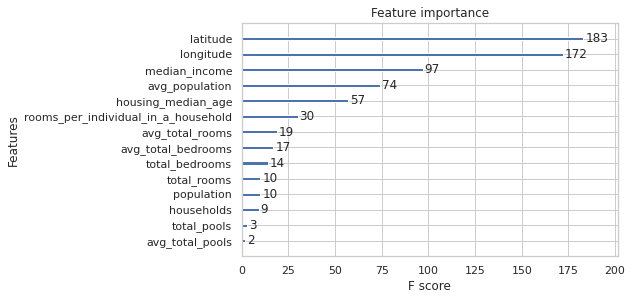

In [56]:
xgb.plot_importance(optimised_model.steps[0][1])
plt.rcParams['figure.figsize'] = [5, 8]
plt.show()

This feature importance plot shows the importance of each features that the algorithm has taken into consideration. This gives us the feeling the algorithm is considering features logically. 

In some cases, the algorithm might consider totally different combination of features which might get unnoticed if we are not visualizing. 

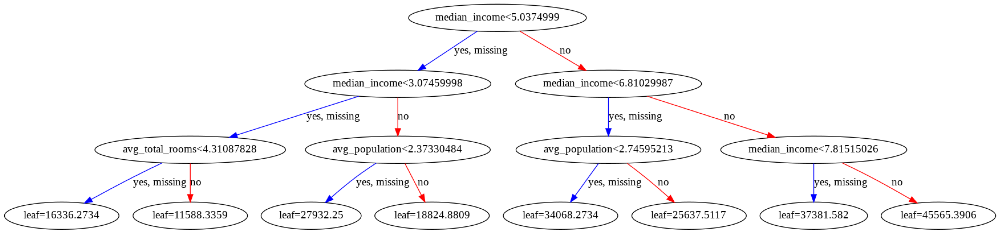

In [57]:
# plot single tree
fig, ax = plt.subplots(figsize=(80, 190))
plot_tree(optimised_model.steps[0][1], ax=ax, num_trees=0)
plt.show()

Let's fine tune the model.

In [0]:
models = {
    'XGBRegressor': XGBRegressor(eval_metric="rmse", objective = "reg:squarederror")
}

params = {
    'XGBRegressor': {
        "max_depth": [8, 10], #increasing the depth of the tree,
        "n_estimators": [150, 200] # increasing number of trees
    }
}

In [59]:
helper = EstimatorSelectionHelper(models, params)
helper.fit(x_train,y_train, scoring="neg_mean_squared_error", n_jobs=-1, cv=5, refit=True)
results =helper.score_summary(sort_by='mean_score')
helper.plot_results("mean_score")
results

Running GridSearchCV for XGBRegressor.
Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  2.1min finished


,estimator,min_score,mean_score,max_score,std_score,XGBRegressor__max_depth,XGBRegressor__n_estimators
2,XGBRegressor,45769.2,47462.1,49667.7,1431.46,10,150
3,XGBRegressor,45722.3,47374.9,49575.5,1405.15,10,200
0,XGBRegressor,45502.8,46398.7,48352.1,1083.83,8,150
1,XGBRegressor,45348.1,46232,48153.2,1073.92,8,200


## Results

In [60]:
optimised_model = helper.best_estimator("XGBRegressor")
print(optimised_model)


Pipeline(memory=None,
         steps=[('XGBRegressor',
                 XGBRegressor(base_score=0.5, booster='gbtree',
                              colsample_bylevel=1, colsample_bynode=1,
                              colsample_bytree=1, eval_metric='rmse', gamma=0,
                              importance_type='gain', learning_rate=0.1,
                              max_delta_step=0, max_depth=8, min_child_weight=1,
                              missing=None, n_estimators=200, n_jobs=1,
                              nthread=None, objective='reg:squarederror',
                              random_state=0, reg_alpha=0, reg_lambda=1,
                              scale_pos_weight=1, seed=None, silent=None,
                              subsample=1, verbosity=1))],
         verbose=False)


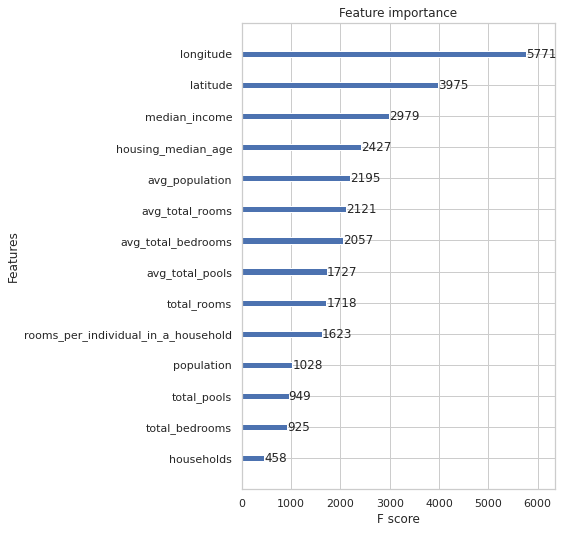

In [61]:
xgb.plot_importance(optimised_model.steps[0][1])
plt.rcParams['figure.figsize'] = [5, 8]
plt.show()

It is good to notice that longitude has received higher importance than latitude. The latitude of Californian state ranges from 41 to 32 whereas the longitude ranges from -124 to -114.

In [62]:
rmse, mae = TestEvaluation(optimised_model).test_score(x_test, y_test)
print("Test dataset - RMSE score : ",rmse)
print("Test dataset - MAE score : ", mae)

Test dataset - RMSE score :  44148.44378779468
Test dataset - MAE score :  29012.974865039538


# Iteration IV - Top Cities distance - RMSE: 43K

World known logic behind housing price depends on where the house is, right! If we dig deeper, whether the house is nearby a city where everything is within reach or outside the city where not everything would be available in a reach. 

So, what if we measure distance between the top cities at California and each sample and use them as features.

All my knowledge about US was from University of HOLLYWOOD (kidding:P). I took the help from [Wikipedia](https://en.wikipedia.org/wiki/California#Demographics), to find the top cities and their coordinates.

## Feature engineering

In [0]:
californian_top_cities = {
    "Los Angeles":(34.05, -118.25),
    "San Diego":(32.715, -117.1625),
    "San Jose":(37.333333, -121.9),
    "San Francisco" :(37.7775, -122.416389),
    "Fresno": (36.75, -119.766667),
    "Sacramento":(38.581667, -121.494444),
    "Long Beach":(33.768333, -118.195556),	
    "Oakland":(37.804444, -122.270833),
    "Bakersfield":(35.366667, -119.016667),
    "Anaheim":(33.836111, -117.889722),
}

Let's verify the data!

In [64]:
from folium import Marker

# Create a base map
map_to_plot = folium.Map(location=[38.481380, -115.758344], tiles='cartodbpositron', zoom_start=6)

# Add a bubble map to the base map
for city, pos in californian_top_cities.items():
    Marker(
        location=pos,
        popup=city,
        icon=folium.Icon(icon='cloud')
    ).add_to(map_to_plot)
    

# Display the map
map_to_plot

## Dataset preparation

In [0]:
x_train = df.loc[train_index].drop(["ocean_proximity","median_house_value"], axis=1)
y_train = df.loc[train_index][["median_house_value"]]
x_test = df.loc[test_index].drop(["ocean_proximity","median_house_value"], axis=1)
y_test = df.loc[test_index][["median_house_value"]]

In order to measure distance between coordinates, we could use either [Haversine](https://en.wikipedia.org/wiki/Haversine_formula) or [Vincenty formulaes](https://en.wikipedia.org/wiki/Vincenty's_formulae)  formulae. In our case, I will go for Vincenty's formula from [geopy](https://github.com/geopy/geopy) library.

In [0]:
from geopy.distance import distance

from sklearn.base import BaseEstimator, TransformerMixin

class DistanceWithTopCities( BaseEstimator, TransformerMixin ):
    def __init__(self,top_cities_pos):
        self.top_cities_pos = top_cities_pos

    def fit(self, X, y = None ):
        return self
        
    def transform(self, X, y = None ):
        for city,pos in self.top_cities_pos.items():
            X[city+"_distance"] = X.apply(lambda row: distance(pos, (row["latitude"],row["longitude"])).km, axis=1)
        return X

dist_feature= DistanceWithTopCities(californian_top_cities)
x_train_transformed = dist_feature.fit_transform(x_train.reset_index(drop=True))
x_test_transformed = dist_feature.transform(x_test.reset_index(drop=True))

## Model development

In [0]:
models = {
    'XGBRegressor': XGBRegressor(eval_metric="rmse", objective = "reg:squarederror")
}

params = {
    'XGBRegressor': {
        "max_depth": [8, 10], #increasing the depth of the tree,
        "n_estimators": [150, 200] # increasing number of trees
    }
}

In [68]:
helper = EstimatorSelectionHelper(models, params)
helper.fit(x_train_transformed, y_train, scoring="neg_mean_squared_error", n_jobs=-1, cv=5, refit=True)
results =helper.score_summary(sort_by='mean_score')
helper.plot_results("mean_score")
results

Running GridSearchCV for XGBRegressor.
Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  3.4min finished


,estimator,min_score,mean_score,max_score,std_score,XGBRegressor__max_depth,XGBRegressor__n_estimators
2,XGBRegressor,43507.3,45042.9,46642.1,1064.97,10,150
3,XGBRegressor,43345.4,44918.7,46577.7,1091.63,10,200
0,XGBRegressor,43382.4,44511.1,46116.7,902.94,8,150
1,XGBRegressor,43196,44290.6,45814.3,861.194,8,200


In [69]:
optimised_model = helper.best_estimator("XGBRegressor")
print(optimised_model)

Pipeline(memory=None,
         steps=[('XGBRegressor',
                 XGBRegressor(base_score=0.5, booster='gbtree',
                              colsample_bylevel=1, colsample_bynode=1,
                              colsample_bytree=1, eval_metric='rmse', gamma=0,
                              importance_type='gain', learning_rate=0.1,
                              max_delta_step=0, max_depth=8, min_child_weight=1,
                              missing=None, n_estimators=200, n_jobs=1,
                              nthread=None, objective='reg:squarederror',
                              random_state=0, reg_alpha=0, reg_lambda=1,
                              scale_pos_weight=1, seed=None, silent=None,
                              subsample=1, verbosity=1))],
         verbose=False)


## Results

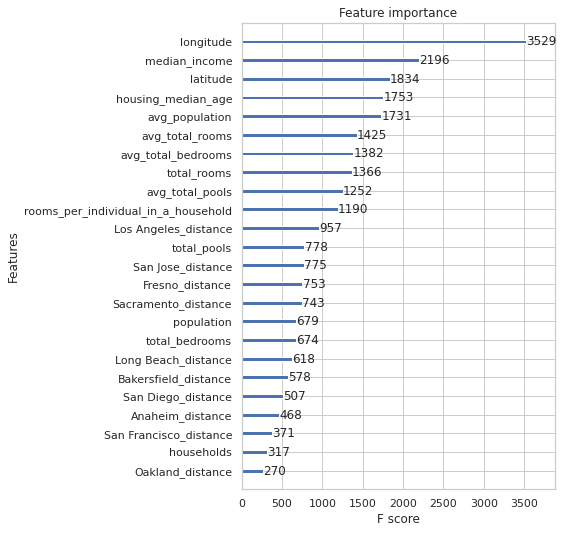

In [70]:
xgb.plot_importance(optimised_model.steps[0][1])
plt.rcParams['figure.figsize'] = [5, 8]
plt.show()

In [71]:
rmse, mae = TestEvaluation(optimised_model).test_score(x_test_transformed, y_test)
print("Test dataset - RMSE score : ",rmse)
print("Test dataset - MAE score : ", mae)

Test dataset - RMSE score :  42989.05382470021
Test dataset - MAE score :  28057.39371578467


# Future Improvements

### Fine tuning model
* Parameters such as **n_estimators** and **max_depth** could fine tuned
* This could lead to bias, thus it is  good to take into consideration of regularization parameter **gamma**

### Model choices

* [LightGBM](https://www.microsoft.com/en-us/research/project/lightgbm/) and [CatBoost](https://catboost.ai/docs/concepts/python-reference_catboostregressor.html) are similar gradient boosting algorithms which are also high performance algorithms in similar usecases.

* Using deep learning will be a considerable choice because with amount of features we have already generated it could synthesis its own feature representation. 

### Feature engineering
* We have included only distance of each sample from top 10 cities. Including few more cities where we found clusters could help us to improve the results


# Conclusion


<img align="right" width="500" height="300" src="https://source.unsplash.com/rMx6DPhGGrk/">


* Iterative development
    - After doing the exploratory data analysis, we might get lot of ideas to do the data preparation and feature engineering. That's good. But start with something simple, so that we can analyse the effect of changes.
* Pipelines & Grid Search CV 
    - I spent most of my time in setting up this structure for automation. I know it's worth spending because it could be easily used for any other problem. Also, it enables us to fix the boilerplate process and enables us to focus on improvement steps.
* Start with logical thinking
    - Asking ourself, what features does your brain utilize to predict the house price in real life without any of these algorithms? Check for those first. Yes, sometimes machines will find pattern that was not easy for our brains to pickup. Nevertheless, start with logical features and build upon it iteratively.
